# Tutorial: Relative Elevation Model: Mississippi River

- Credit: [Dahn](https://twitter.com/DahnJahn)

# Step 0: Setup

### Imports

In [1]:
!pip install osmnx scipi xarray rioxarray matplotlib datashader -q

ERROR: Could not find a version that satisfies the requirement scipi (from versions: none)
ERROR: No matching distribution found for scipi


In [2]:
pip install xarray-spatial -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 18.1 MB/s eta 0:00:00


In [7]:
pip install osmnx


  Using cached osmnx-2.0.2-py3-none-any.whl.metadata (4.9 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.9/99.9 kB 2.6 MB/s eta 0:00:00


In [9]:
pip install rioxarray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 24.3 MB/s eta 0:00:00


In [10]:
pip install datashader

In [12]:
from pathlib import Path
from IPython.core.display import Video

import numpy as np
import pandas as pd
import geopandas as gpd  # Vector data handling
import osmnx as ox       # Downloading data from OSM

from shapely.geometry import box
from scipy.spatial import cKDTree as KDTree # For Inverse Distance Weight calculation

import xarray as xr
import xrspatial    # Hillshading
import rioxarray    # Working with geospatial data in xarray

import matplotlib.pyplot as plt
from datashader.transfer_functions import shade, stack

## Step 1: Download & Load DEM

- [USGS LidarExplorer](https://prd-tnm.s3.amazonaws.com/LidarExplorer/index.html#/)

#### **VIDEO**: How to download data from NLS

The downloaded data can be combined using the convenience function[`combine_by_coords`](https://xarray.pydata.org/en/stable/generated/xarray.combine_by_coords.html#xarray.combine_by_coords).

In [15]:
dem = rioxarray.open_rasterio('/content/dem_compress.tif')

In [36]:
pip install geojson

In [37]:
import geojson

Make DEM smaller and clip to focus area

In [38]:
geom = '''{"type": "Polygon",
                "coordinates":[[
                pip install osmnx
                 [104.5, 9.5],
                 [105.5, 9.5],
                 [105.5, 10.5],
                 [104.5, 10.5]]]}'''

In [39]:
cropping_geometries = [geojson.loads(geom)]
cropped = dem.rio.clip(geometries=cropping_geometries, crs=4326)

JSONDecodeError: Expecting value: line 3 column 17 (char 69)

In [ ]:
cropped = cropped.coarsen(x=3, boundary='trim').mean().coarsen(y=3, boundary='trim').mean()

Let's plot the DEM

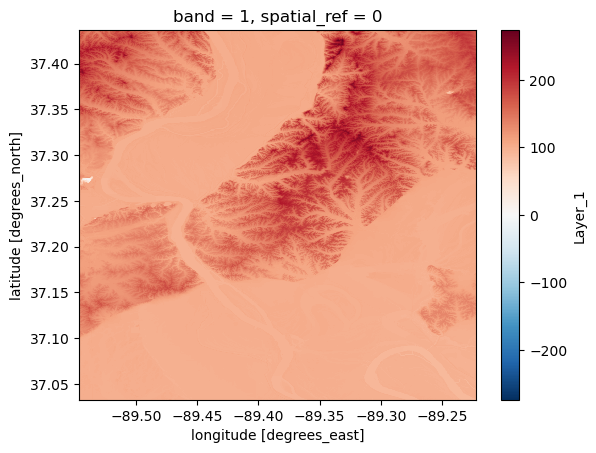

In [ ]:
cropped.squeeze().plot.imshow()

## Step 2: Fetch coordinates of the river

In [ ]:
river = ox.geocode_to_gdf('Mississippi River', which_result=1)
river = river.to_crs(cropped.rio.crs)

Let's plot the river

<Axes: >

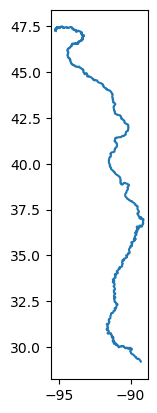

In [ ]:
river.plot()

## Step 3: Cut to area of interest

#### River

In [ ]:
cropped.rio.bounds()

(-89.54629629634545, 37.03287036966892, -89.22231481451543, 37.436574073806895)

In [ ]:
bounds = cropped.rio.bounds()
xmin, ymin, xmax, ymax = bounds

In [ ]:
river = river.clip(bounds)

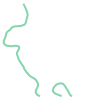

In [ ]:
river_geom = river.geometry.iloc[0]
river_geom

#### DEM

In [ ]:
cropped = cropped.sel(y=slice(ymax, ymin), x=slice(xmin, xmax))

Let's check if everything looks good

<Axes: title={'center': 'band = 1, spatial_ref = 0'}, xlabel='longitude [degrees_east]', ylabel='latitude [degrees_north]'>

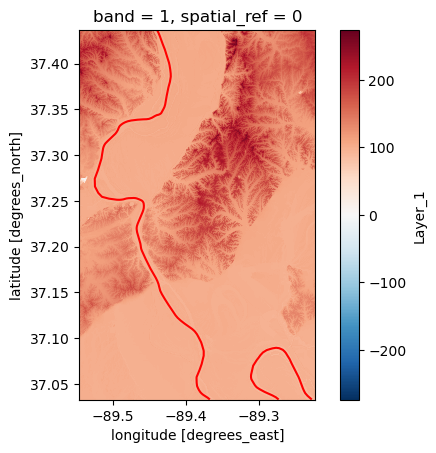

In [ ]:
fig, ax = plt.subplots()
cropped.squeeze().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

## Step 4: Calculate REM

To calculate the REM, we need to
1. Sample the elevation along the river
2. Interpolate the sampled elevation values to create a 2D elevation raster
3. Subtract the interpolated elevation raster from the DEM

### 4.1. Sample

Extract coordinates as `DataArray`

In [ ]:
import shapely

def split_coords(geom):
    x = []
    y = []
    for i in shapely.get_coordinates(geom):
        x.append(i[0])
        y.append(i[1])
    return x, y


In [ ]:
xs, ys = split_coords(river_geom)
xs, ys = xr.DataArray(xs, dims='z'), xr.DataArray(ys, dims='z')

Use xarray's [`interp`](https://xarray.pydata.org/en/stable/generated/xarray.DataArray.interp.html#xarray.DataArray.interp) to extract the river's elevation.

In [ ]:
sampled = cropped.interp(x=xs, y=ys, method='nearest').dropna(dim='z')

### 4.2. Interpolate

Prepare data for the interpolation

In [ ]:
# Sampled river coordinates
c_sampled = np.vstack([sampled.coords[c].values for c in ('x', 'y')]).T

# All (x, y) coordinates of the original DEM
c_x, c_y = [cropped.coords[c].values for c in ('x', 'y')]
c_interpolate = np.dstack(np.meshgrid(c_x, c_y)).reshape(-1, 2)

# Sampled values
values = sampled.values.ravel()

In [ ]:
c_interpolate

array([[-89.54625   ,  37.43652778],
       [-89.54597222,  37.43652778],
       [-89.54569444,  37.43652778],
       ...,
       [-89.22291667,  37.03291667],
       [-89.22263889,  37.03291667],
       [-89.22236111,  37.03291667]])

Perform the interpolation. Here we use a simple implementation of [IWD](https://en.wikipedia.org/wiki/Inverse_distance_weighting) which averages the 5 nearest points, weighted by inverse distance.

In [ ]:
tree

In [ ]:
tree = KDTree(c_sampled)

In [ ]:
# IWD interpolation
distances, indices = tree.query(c_interpolate, k=50)

weights = 1 / distances
weights = weights / weights.sum(axis=1).reshape(-1, 1)

interpolated_values = (weights * values[indices]).sum(axis=1)

In [ ]:
interpolated_values

array([98.31997252, 98.32033693, 98.32070347, ..., 90.30985072,
       90.3143536 , 90.3187768 ])

We create a `DataArray` out of the inerpolated values

In [ ]:
elevation_raster = xr.DataArray(
    interpolated_values.reshape((len(c_y), len(c_x))).T, dims=('x', 'y'), coords={'x': c_x, 'y': c_y}
)

<Axes: xlabel='x', ylabel='y'>

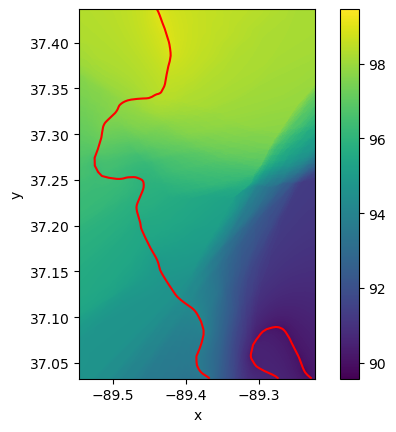

In [ ]:
fig, ax = plt.subplots()
elevation_raster.transpose().plot.imshow(ax=ax)
river.plot(ax=ax, color='red')

### 4.3. Calculate

In [ ]:
rem = cropped - elevation_raster

# Step 5: Visualize

Let's make some pretty REM visualizations!

In [ ]:
colors = ['#f2f7fb', '#81a8cb', '#37123d']

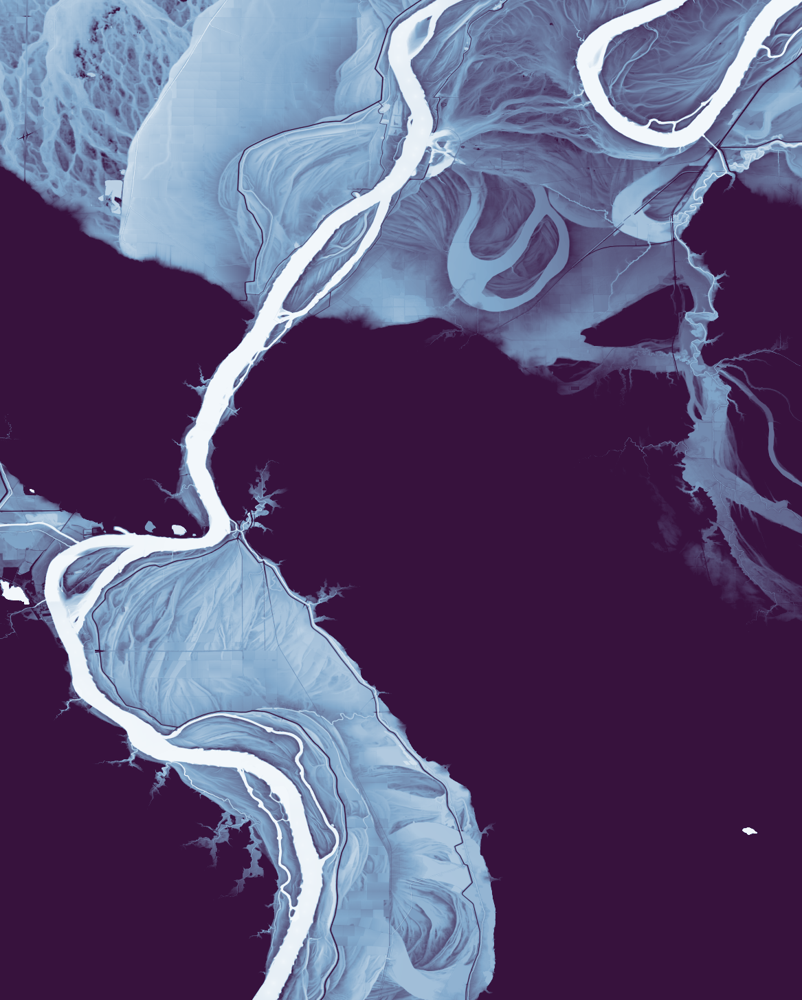

In [ ]:
shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear')

![](https://i.imgur.com/MFagpMt.jpg)

We can also visualize the DEM along with the REM

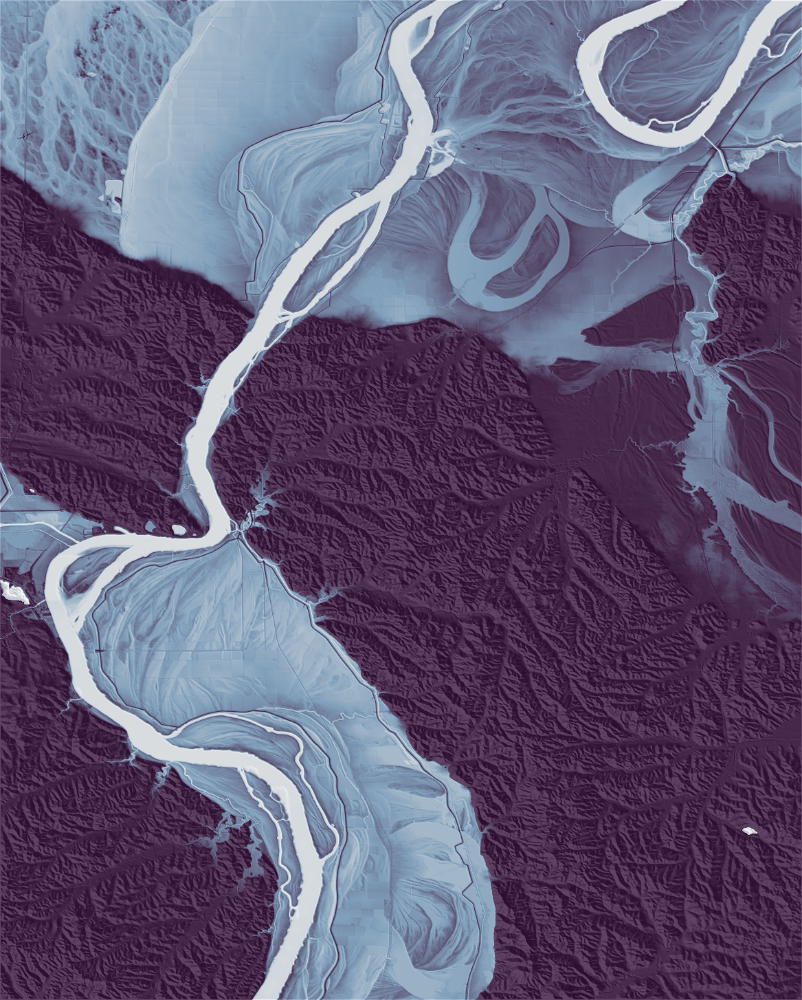

In [ ]:
a = shade(xrspatial.hillshade(cropped.squeeze(), angle_altitude=1, azimuth=310), cmap=['black', 'white'], how='linear')
b = shade(rem.squeeze(), cmap=colors, span=[0, 10], how='linear', alpha=200)
stack(a, b)

![](https://i.imgur.com/jRXcHVi.jpg)